# RAPORT KOŃCOWY #team20

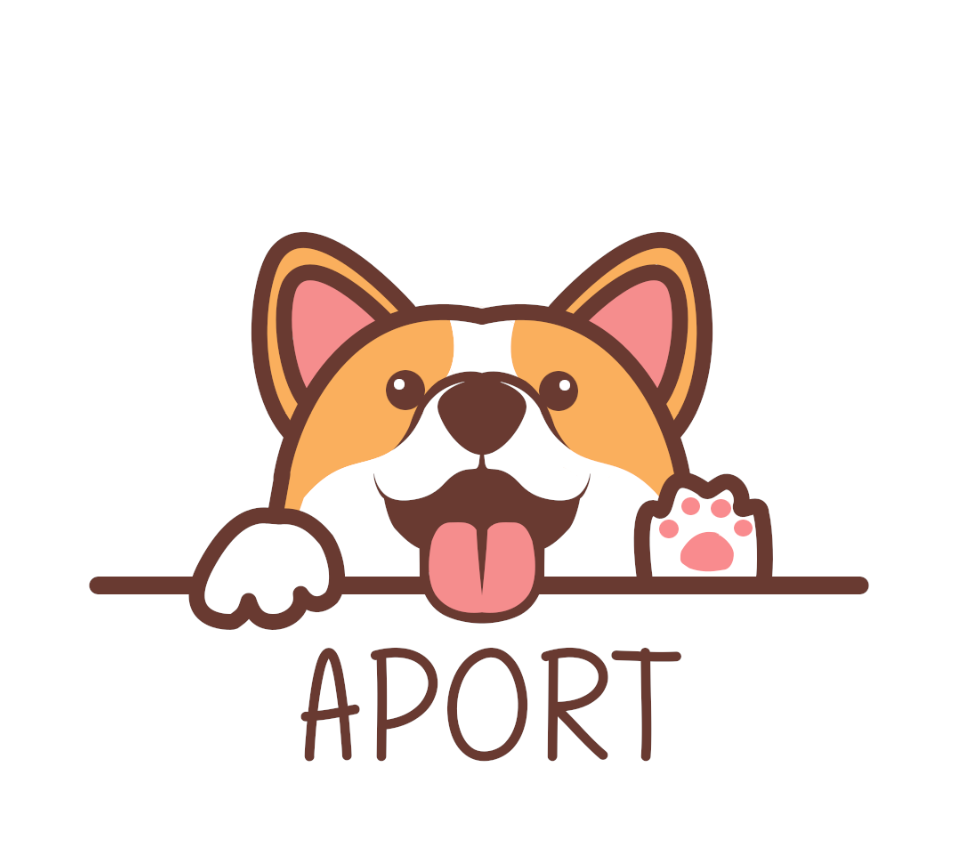

---
---


In [1]:
from sqlalchemy import create_engine
import sqlalchemy
import pandas as pd
from sqlalchemy import inspect
from dotenv import load_dotenv
import os
import sys
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.dates import date2num
import seaborn as sns

sys.path.insert(0,'..')

sns.set()
matplotlib.rcParams['figure.figsize'] = (15, 8)

In [2]:
dotenv_path = os.path.join('..', '.env')
load_dotenv(dotenv_path)

SQL_CONNECTOR = os.getenv('SQL_CONNECTOR')

In [10]:
engine = create_engine(SQL_CONNECTOR)

---
---

# SPIS TREŚCI
Jakiego zagadnienia dotyczy poszczególny segment oraz odpowiedzi na jakie pytania zawiera

---

## 1. WIZYTY
### 1.1 Wykres przedstawiający liczbę wizyt każdego dnia i każdego miesiąca
### 1.2 Wykres przedstawiający zmianę liczby zarejestrowanych zwierząt w czasie
### 1.3 Wykres przedstawiający częstość występowania wizyt danej długości 
### 1.4 Wykres rozkładu wizyt w ciągu dnia w zależności od tego, czy jest to dzień roboczy czy weekend 

---

## 2. PIENIĄDZE
### 2.1 Wykres przedstawiający bilans zysków i strat kliniki
### 2.2 Lista właścicieli, którzy zostawili w klinice najwięcej oraz najmniej pieniędzy
### 2.3 Wykres 15 najdroższych sprzętów dostępnych w klinice

---

## 3. ZWIERZĘTA
### 3.1 Wykres porównania dziennej liczby psów i kotów odwiedzających klinikę 
### 3.2 Lista zwierząt, które spędziły w klinice najwięcej czasu
### 3.3 Lista zawierająca średni wiek, w którym dany gatunek jest poddawany eutanazji
### 3.4 Wykres przedstawiający, ile średnio pieniędzy jest przeznaczane na przedstawicieli poszczególnych ras kotów
### 3.5 Wykres liczby ras w poszczególnych gatunkach leczonych w klinice
### 3.6 Wykres liczby zwierząt poszczególnych gatunków leczonych w klinice
### 3.7 Wykres zależności wieku zwierzęcia od wieku właściciela
### 3.8 Wykres porównania liczby samiczek i samców rejestrowanych w klinice

---

## 4. LEKARZE
### 4.1 Lista lekarzy, którzy najczęściej wydawali paszporty
### 4.2 Lista lekarzy, którzy pobrali najwięcej pieniędzy za swoje wizyty
### 4.3 Lista lekarzy, którzy przepracowali w klinice najwięcej czasu 
### 4.4 Lista lekarzy, którzy najwięcej razy przyjęli na wizytę psa typu corgie

---


## 5. PODSUMOWANIE PRACY


---
---

## 1. WIZYTY

### 1.1 Wykres przedstawiający liczbę wizyt każdego dnia i każdego miesiąca

<div style="text-align:justify"> 
Poniższe wykresy przedstawiają liczbę wizyt każdego dnia oraz sumę wizyt w poszczególnych miesiącach. Obrazują jak rozwijała się klinika i jak zyskiwała nowych klientów. Zgodnie z przyjętymi przy wypełnianu bazy założeniami, przez pierwsze 7 miesięcy klinika dopiero zaczyna swoją działalność i przyjmuje dużo mniej klientów. Po tym czasie liczba przyjmowanych pacjentów wzrasta. Liczba wizyt nie jest stała każdego dnia, ponieważ zależy od ich długości (w czasie jednej 2 godzinnej wizyty mogło odbyć się 8 piętnastominutowych), co powoduje wahania również w sumarycznej liczbie wizyt miesięcznych. W każdym miesiącu utrzymują się one jednak na podobnym poziomie, a różnica pomiędzy nimi nie przekracza 100. Znaczny spadek w czerwcu spowodowany rozpatrywaniem tylko części tego miesiąca.
</div>

In [14]:
wizyty = pd.read_sql('''SELECT Data, COUNT(*) AS `Liczba wizyt`
               FROM Wizyty 
               GROUP BY Data''', con=engine)
wizyty

,Data,Liczba wizyt
0,2019-10-05,2
1,2019-10-06,1
2,2019-10-07,15
3,2019-10-08,6
4,2019-10-09,15
...,...,...
609,2021-06-14,10
610,2021-06-15,23
611,2021-06-16,11
612,2021-06-17,31


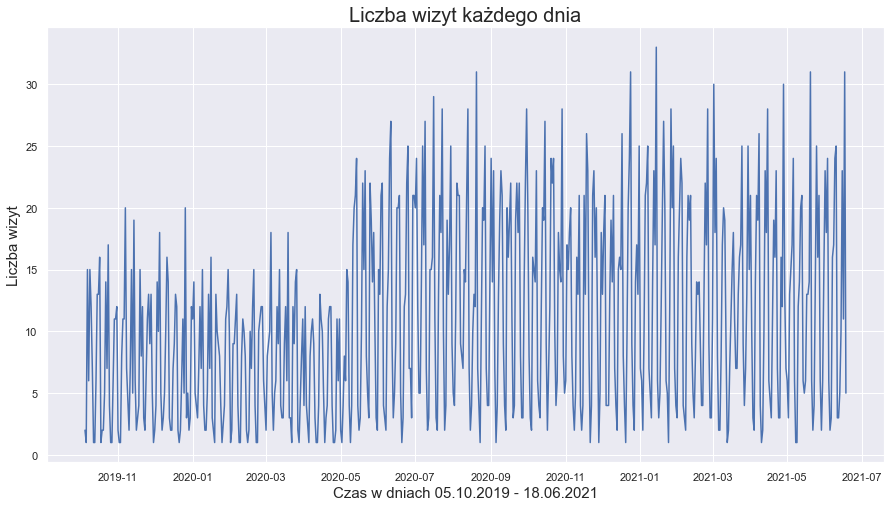

In [15]:
plt.plot(wizyty['Data'].values, wizyty['Liczba wizyt'].values)
plt.title('Liczba wizyt każdego dnia', fontsize=20)
plt.xlabel('Czas w dniach 05.10.2019 - 18.06.2021', fontsize=15)
plt.ylabel('Liczba wizyt', fontsize=15)
plt.show()

In [16]:
wizyty = pd.read_sql('''SELECT Concat(MONTH(Data), '.', YEAR(Data)) AS Miesiąc, COUNT(*) AS `Liczba wizyt`
               FROM Wizyty
               GROUP BY YEAR(Data), MONTH(Data)''', con=engine)
wizyty

,Miesiąc,Liczba wizyt
0,10.2019,202
1,11.2019,213
2,12.2019,223
3,1.2020,230
4,2.2020,194
5,3.2020,235
6,4.2020,186
7,5.2020,324
8,6.2020,385
9,7.2020,431


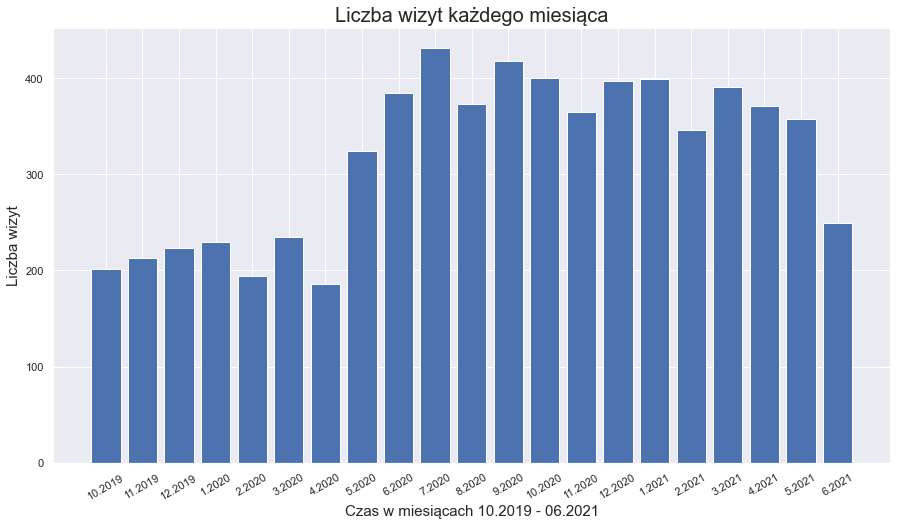

In [17]:
plt.bar(wizyty['Miesiąc'].values, wizyty['Liczba wizyt'].values)
plt.title('Liczba wizyt każdego miesiąca', fontsize=20)
plt.xticks(rotation=30)
plt.xlabel('Czas w miesiącach 10.2019 - 06.2021', fontsize=15)
plt.ylabel('Liczba wizyt', fontsize=15)
plt.show()

### 1.2 Wykres przedstawiający zmianę liczby zarejestrowanych zwierząt w czasie

<div style="text-align:justify"> 
Przeanalizowane zostać może również jak zmieniała się liczba zarejstrowanych zwierząt. Widać, że rośnie ona w czasie w sposób w przybliżeniu liniowy. Nawiązując do wzrostu ilości wizyt, wzrost liczby zarejstrowanych zwierząt jest sprawą raczej oczywistą. Uwzględniana jest sytuacja, w której zwierzę zostało uśpione i nie jest ono uwzględniane na wykresie. Nie ma jednak obowiązku wyrejstrowywania zwierzęcia jeśli zaśnie wiecznym snem. Tak więc jeśli zwierzę przestanie się pojawiać w klinice opcje są dwie - albo jest perfekcyjnie zdrowe albo nie żyje. 
</div>

In [18]:
liczba_rejestracji = pd.read_sql('''WITH liczba_rej AS (SELECT `Data rejestracji`, Count(id_zwierzęcia) `Liczba zwierzaków`
                                   FROM Zwierzęta
                                   GROUP BY `Data rejestracji`),
                                   eutanazja AS (SELECT `Data rejestracji`, Count(id_zwierzęcia) 
                                                  AS `Liczba eutanazji`
                                                   FROM Zwierzęta
                                                   INNER JOIN Wizyty
                                                   USING (id_zwierzęcia)
                                                   WHERE `Rodzaj wizyty` = 'eutanazja'
                                                   GROUP BY `Data rejestracji`),
                                    polaczenie AS (SELECT `Data rejestracji`, 
                                                  CASE WHEN `Liczba eutanazji` IS NULL THEN `Liczba zwierzaków`
                                                  ELSE `Liczba zwierzaków` - `Liczba eutanazji` END AS `Liczba zarejestrowanych zwierząt`
                                                   FROM liczba_rej
                                                   LEFT JOIN eutanazja
                                                   USING (`Data rejestracji`))
                                                   
                                   SELECT `Data rejestracji`, Sum(`Liczba zarejestrowanych zwierząt`) 
                                   Over (Order By `Data rejestracji` ) AS `Liczba zarejestrowanych zwierząt`
                                   FROM polaczenie''', con=engine)
liczba_rejestracji

,Data rejestracji,Liczba zarejestrowanych zwierząt
0,2019-10-05,1.0
1,2019-10-06,2.0
2,2019-10-07,3.0
3,2019-10-08,4.0
4,2019-10-10,6.0
...,...,...
519,2021-05-31,963.0
520,2021-06-01,967.0
521,2021-06-02,969.0
522,2021-06-03,970.0


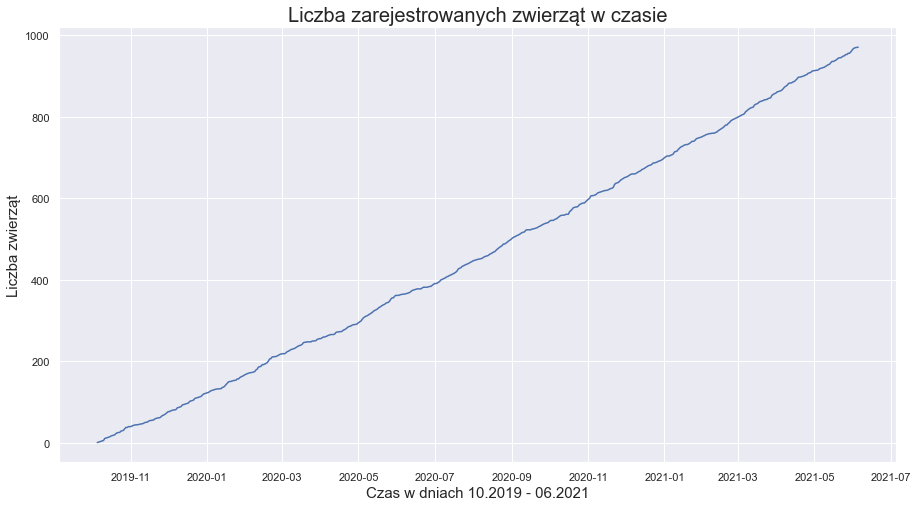

In [19]:
plt.figure()

plt.plot(liczba_rejestracji['Data rejestracji'].values, liczba_rejestracji['Liczba zarejestrowanych zwierząt'].values)
plt.xlabel('Czas w dniach 10.2019 - 06.2021', fontsize=15)
plt.ylabel('Liczba zwierząt', fontsize=15)
plt.title('Liczba zarejestrowanych zwierząt w czasie', fontsize=20)
plt.show()

### 1.3 Wykres przedstawiający częstość występowania wizyt danej długości

<div style="text-align:justify"> 
Klinika przeprowadza wizyty o czterech długościach. Przy wypełnianiu bazy zostało przyjęte prawdopodobieństwo występowania poszczególnych wizyt. Analiza powastałej bazy pozwala potwierdzić, że około 40% z przeprowadzanych wizyt to te najkrótsze o długości 15 minut, 30% z nich to wizyty półgodzinne. Wizyty najdłuższe trwające godzinę i dwie to odpowiednio 20% i 10% wszystkich wizyt. Jest to zgdne z intuicją, że częściej pojawia się konieczność drobnych zabiegow niż kilkugodzinnych operacji. Na ustalone prawdopodobieństwo wizyty wpływa także fakt, że te najdłuższe wizyty przeprowadzane są przez chirurga, który w klinice jest tylko jeden. Lekarzy, który zajmują się drobniejszymi i mniej czasochłonnymi sprawami jest dwóch, więc również ilość wizyt krótkich jest większa.
</div>

In [20]:
częstość_wizyt = pd.read_sql('''
            SELECT `Czas trwania wizyty`, count(id_wizyty)/(SELECT count(id_wizyty) FROM Wizyty) AS `Odsetek wizyt`
            FROM Wizyty
            GROUP BY `Czas trwania wizyty`
            ORDER BY count(id_wizyty) DESC
            
''', con=engine)
częstość_wizyt

,Czas trwania wizyty,Odsetek wizyt
0,0 days 00:15:00,0.3900
1,0 days 00:30:00,0.2979
2,0 days 01:00:00,0.2073
3,0 days 02:00:00,0.1048


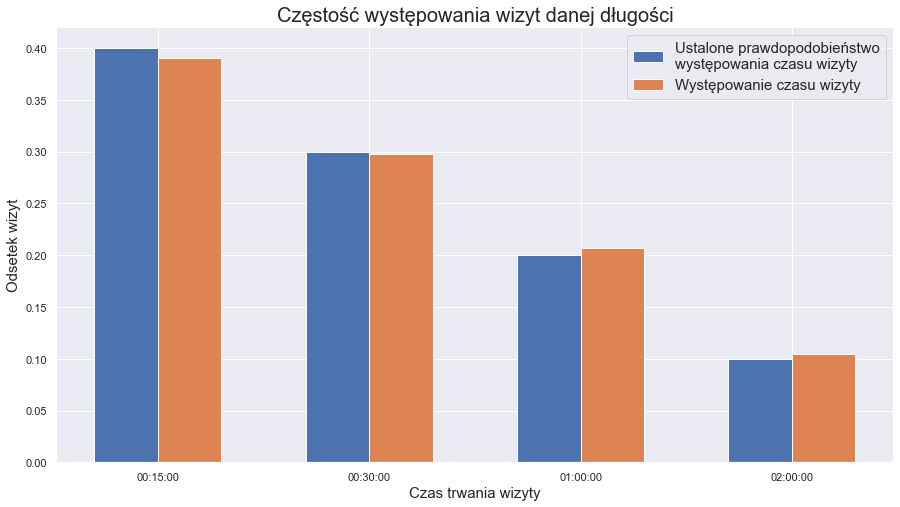

In [21]:
plt.bar([str(i)[7:] for i in częstość_wizyt['Czas trwania wizyty']], [0.4,  0.3, 0.2, 0.1], width=-0.3, align='edge')
plt.bar([str(i)[7:] for i in częstość_wizyt['Czas trwania wizyty']], częstość_wizyt['Odsetek wizyt'].values, width=0.3, align='edge')

plt.legend(['Ustalone prawdopodobieństwo\nwystępowania czasu wizyty', 'Występowanie czasu wizyty'], fontsize=15)

plt.title('Częstość występowania wizyt danej długości', fontsize=20)
plt.xlabel('Czas trwania wizyty', fontsize=15)
plt.ylabel('Odsetek wizyt', fontsize=15)
plt.show()

### 1.4 Rozkład wizyt w ciągu dnia w zależności od tego czy jest to dzień roboczy czy weekend 

<div style="text-align:justify"> Analizie poddany został również rozkład wizyt w ciągu dnia. W dni robocze widać, że najwięcej wizyt dobywa się pomiędzy 8:00 a 9:00 rano. Dalsze godziny, aż do 16:00, charakteryzują się podobnym odsetkiem przeprowadzanych wizyt. Liczba wizyt odbywających się po godzinie 16 znacznie spada. Powodem takiego rozkładu może być fakt, że klinika otwarta jest codziennie od godziny 8:00, natomiast od poniedziałku do piątku funkcjonuje do godziny 16:00, a w czwartki i piątki do 18:00. Fakt największego zainteresowania wizytami porannymi może być związany z tym, że klienci kliniki również są osobami pracującymi i godzina 8:00 pozwala im na zaopiekowanie się pupilem jeszcze przed rozpoczęciem pozostałych obowiązków. W weekendy najwięcej wizyt ponownie odbywa się w pierwszej godzinie otwarcia, w dalszych godzinach rozkładają się równomiernie. Odsetek wizyt weekendowych jest znacznie mniejszy niż tych odbywających się w dni robocze, weekend jest czasem odpoczynku dla wszystkich, nawet lekarzy, i tylko jeden z nich pełni dyżur. 
    </div>

In [22]:
godziny_w_tygodniu = pd.read_sql('''SELECT HOUR(Godzina) AS Godzina, COUNT(*) / (SELECT COUNT(*) FROM Wizyty)
                        AS `Odsetek wizyt w tygodniu`
                        FROM Wizyty
                        WHERE DAYOFWEEK(Data) BETWEEN 2 AND 6
                        GROUP BY HOUR(Godzina)''', con=engine)
godziny_w_tygodniu

,Godzina,Odsetek wizyt w tygodniu
0,8,0.1392
1,9,0.1019
2,10,0.1060
3,11,0.0963
4,12,0.1091
5,13,0.1046
6,14,0.0993
7,15,0.1040
8,16,0.0324
9,17,0.0344


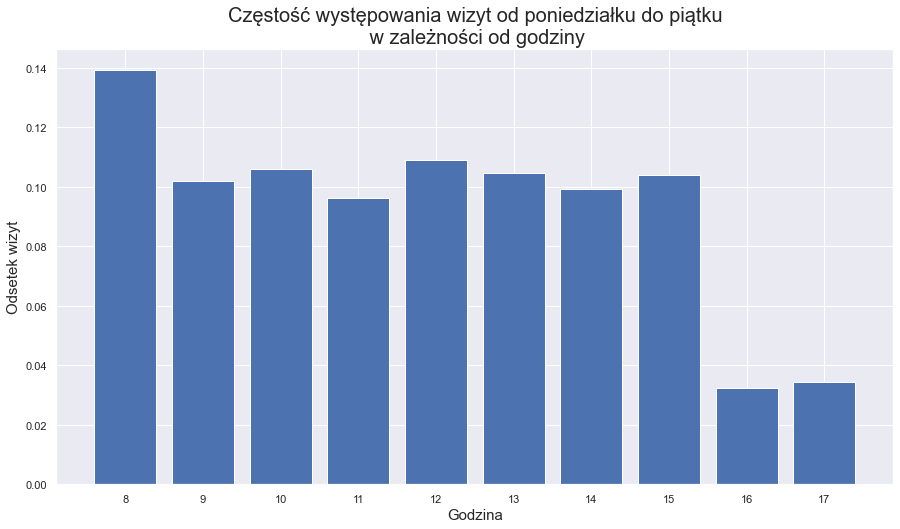

In [23]:
plt.figure()
plt.bar(godziny_w_tygodniu['Godzina'], godziny_w_tygodniu['Odsetek wizyt w tygodniu'])

plt.xlabel('Godzina', fontsize=15)
plt.xticks(np.arange(8,18,1))
plt.ylabel('Odsetek wizyt', fontsize=15)
plt.title('Częstość występowania wizyt od poniedziałku do piątku\n w zależności od godziny', fontsize=20)

plt.show()

In [24]:
godziny_w_weekend = pd.read_sql('''SELECT HOUR(Godzina) AS Godzina,
                        COUNT(*) / (SELECT COUNT(*) FROM Wizyty) AS `Odsetek wizyt w weekendy`
                        FROM Wizyty
                        WHERE DAYOFWEEK(Data) NOT BETWEEN 2 AND 6
                        GROUP BY HOUR(Godzina)''', con=engine)
godziny_w_weekend

,Godzina,Odsetek wizyt w weekendy
0,9,0.0247
1,10,0.0163
2,11,0.0163
3,12,0.0155


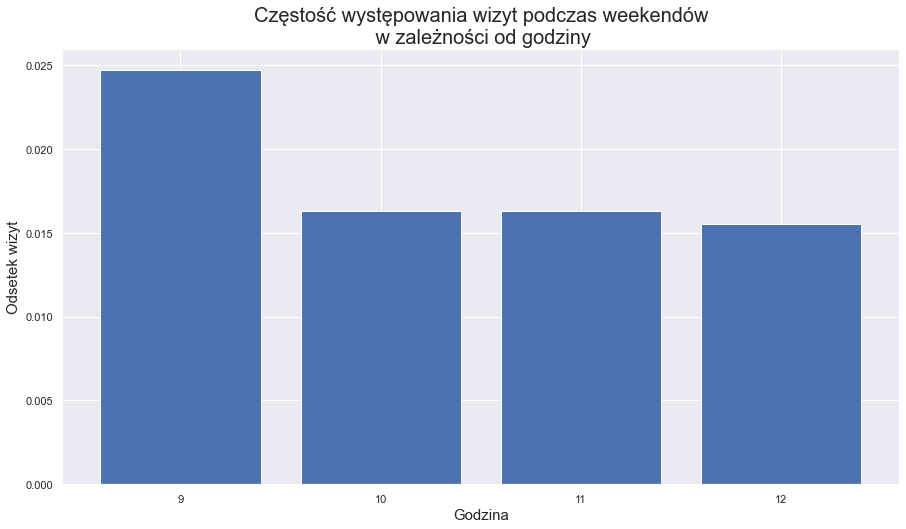

In [25]:
plt.figure()
plt.bar(godziny_w_weekend['Godzina'], godziny_w_weekend['Odsetek wizyt w weekendy'])

plt.xlabel('Godzina', fontsize=15)
plt.xticks(np.arange(9,13,1))
plt.ylabel('Odsetek wizyt', fontsize=15)
plt.title('Częstość występowania wizyt podczas weekendów\n w zależności od godziny', fontsize=20)

plt.show()

--- 
---

## 2. PIENIĄDZE

### 2.1 Wykres przedstawiający bilans zysków i strat kliniki

<div style="text-align:justify"> Zgodnie z założeniem poczynionym przy wypełnianiu bazy, straty rozumiane jako ponoszone koszty są stałe w każdym analizowanym miesiącu. Jest to mocne uproszczenie ignorujące inflację i podwyżki cen prądu. Wchodzące w skład stałych kosztów pensje pracowników, czynsz za wynajem lokalu czy wynagrodzenie ekipy sprzątającej również mogą się zmieniać.</div>

<div style="text-align:justify"> Zyski są natomiast zmienne i uzależnione od liczby przyjętych pacjentów, ponieważ przychody płyną z opłat za przeprowadzone zabiegi. Poniższy wykres przedstawia zestawienie zysków i strat w każdym miesiącu działania kliniki. Na początku działania koszty były znacznie większe od przychodów. Powodem tego jest oczywiście mniejsza liczba wizyt. Wraz ze wzrostem liczby wizyt rosną także przychody kliniki, od maja 2020 roku są stale wyższe od kosztów. Jest to zgodne z ogólną intuicją. Ogólny bilans zysków i strat po niecałych dwóch latach działalności wskazuje, że klinika zarobiła 194770 zł i prężnie się rozwijając nadrobiła marny start. </div>

In [26]:
zyski_straty = pd.read_sql('''SELECT SUM(IF(Kwota>0,Kwota,0)) AS Zyski, SUM(IF(Kwota<0,Kwota,0)) AS Straty, 
                            SUM(IF(Kwota>0,Kwota,0))+SUM(IF(Kwota<0,Kwota,0)) AS Bilans
                            FROM Transakcje''', con=engine)
zyski_straty

,Zyski,Straty,Bilans
0,780770.0,-586000.0,194770.0


In [27]:
zyski_straty = pd.read_sql('''SELECT Data, SUM(IF(Kwota>0,Kwota,0)) AS Zyski, SUM(IF(Kwota<0,Kwota,0)) AS Straty, 
                            SUM(IF(Kwota>0,Kwota,0))+SUM(IF(Kwota<0,Kwota,0)) AS Bilans
                            FROM Transakcje
                            GROUP BY Data''', con=engine)
zyski_straty.head()

,Data,Zyski,Straty,Bilans
0,2019-10-05,190.0,0.0,190.0
1,2019-10-06,60.0,0.0,60.0
2,2019-10-07,1680.0,0.0,1680.0
3,2019-10-08,540.0,0.0,540.0
4,2019-10-09,1770.0,0.0,1770.0


In [28]:
zyski_straty = pd.read_sql('''SELECT Concat(MONTH(Data), '.', YEAR(Data)) AS Miesiąc, 
                            SUM(IF(Kwota>0,Kwota,0)) AS Zyski, 
                            SUM(IF(Kwota<0,Kwota,0)) AS Straty, 
                            SUM(IF(Kwota>0,Kwota,0))+SUM(IF(Kwota<0,Kwota,0)) AS Bilans
               FROM Transakcje
               GROUP BY YEAR(Data), MONTH(Data)''', con=engine)
zyski_straty.head()

,Miesiąc,Zyski,Straty,Bilans
0,10.2019,22320.0,0.0,22320.0
1,11.2019,22820.0,-29300.0,-6480.0
2,12.2019,26830.0,-29300.0,-2470.0
3,1.2020,26870.0,-29300.0,-2430.0
4,2.2020,22310.0,-29300.0,-6990.0


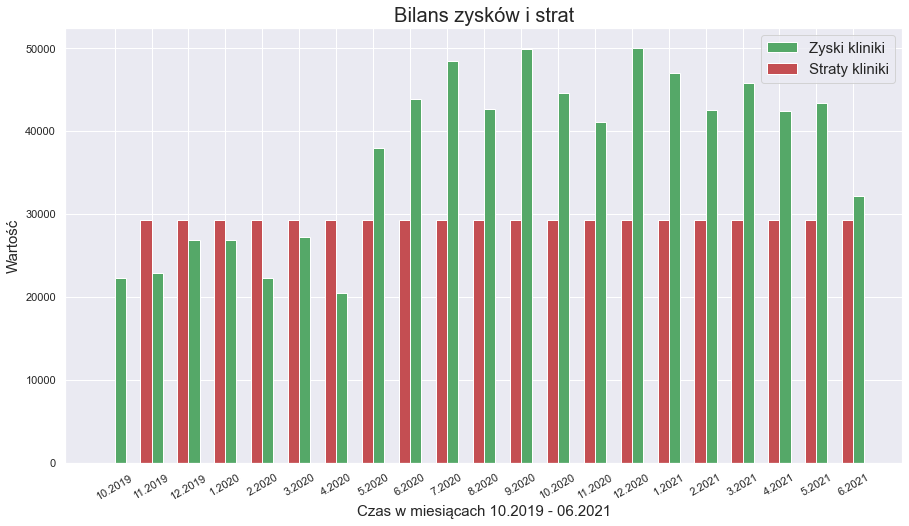

In [29]:
plt.figure()
plt.bar(zyski_straty['Miesiąc'].values, zyski_straty['Zyski'].values, width=0.3, color='g', align='edge')
plt.bar(zyski_straty['Miesiąc'].values, -zyski_straty['Straty'].values, width=-0.3, color='r', align='edge')
plt.title('Bilans zysków i strat', fontsize=20)
plt.xticks(rotation=30)
plt.xlabel('Czas w miesiącach 10.2019 - 06.2021', fontsize=15)
plt.ylabel('Wartość', fontsize=15)
plt.legend(["Zyski kliniki", "Straty kliniki"], fontsize=15)
plt.show()

### 2.2 Lista właścicieli, którzy zostawili w klinice najwięcej oraz najmniej pieniędzy

<div style="text-align:justify"> W analizie przychodów kliniki istotni mogą być klienci, którzy za usługi płacą najwięcej. Rekordzistą w tej kwestii jest Pan Gracjan Martychowiec, który za zabiegi w klinice zapłacił w sumie 4240 zł, będąc posiadaczem tylko dwóch zwierząt - kota i psa, które w sumie były na 40 wizytach. Zarobek ten jest jednak opłacony smutkiem, ponieważ po 22 wizytach na 23 został zmuszony do uśpienia kotki Colly. Drugie miejsce na podium należy do Pana Oliwera Klukiewicza, który wydał w klinice 3980 zł. On również jest posiadaczem dwóch zwierząt - kota oraz szczura. Większość tej kwoty stanowią zapłaty za zabiegi chirurgiczne szczura Zuli, których odbyło się aż 10. Kotka Queen gościła w klinice tylko 3 razy. Zarobek zatem nie jest jak widać uzależniony od ilości posiadanych zwierząt, a od zdrowotnych problemów poszczególnego z nich. Co potwierdza także historia trzeciej największej wydanej przez Pana Waldemara Ciesielczuka kwoty 3790 zł. Jest on posiadaczem kotki, która klinikę odwiedzała aż 38 razy. Warto zwrócić uwagę, że każdy ze wspomnianych pacjentów został zarejstrowany w klinice na samym początku jej działania - w październiku 2019r. co również wpływa na zwiększoną liczbę odbytych wizyty i pozostawionych za nie opłat. </div>
    
<div style="text-align:justify"> Jest tylko jedna osoba, która wydała ponad 4000 zł, natomiast takich, które wydały ponad 3000zł jest kilkanaście, tak samo dla przedziału 2000zł. Najmniejsza wydana w klinice kwota to 30zł. Osób, które wydały mniej niż 100zł jest niecałe 80. Zatem skrajnych wartości w jednym jak i w drugim przypadku jest niewiele. Średnia wydana kwota to natomiast 749 zł. </div>

In [30]:
najwiecej_zostawili = pd.read_sql('''
            SELECT Zwierzęta.id_właściciela AS `ID właściciela`, Właściciele.Imię, Właściciele.Nazwisko, sum(kwota) AS `Wydana kwota`
            FROM Wizyty
            INNER JOIN Transakcje
            ON Transakcje.`id_wizyty jeśli wizyta` = Wizyty.id_wizyty
            INNER JOIN Zwierzęta
            ON Zwierzęta.id_zwierzęcia = Wizyty.id_zwierzęcia
            INNER JOIN Właściciele
            ON Zwierzęta.id_właściciela = Właściciele.id_właściciela
            GROUP BY Zwierzęta.id_właściciela
            ORDER BY `Wydana kwota` DESC
            LIMIT 51
''', con=engine)
najwiecej_zostawili.head(10)

,ID właściciela,Imię,Nazwisko,Wydana kwota
0,329,Gracjan,Martychowiec,4240.0
1,132,Oliwier,Klukiewicz,3980.0
2,88,Waldemar,Ciesielczuk,3790.0
3,724,Irena,Bekier,3420.0
4,51,Maciej,Rapacz,3270.0
5,515,Nikola,Rudner,3270.0
6,260,Mateusz,Bartosiewicz,3260.0
7,609,Agnieszka,Bednarek,3240.0
8,397,Natasza,Gęsioła,3170.0
9,922,Eliza,Kręciołek,3160.0


In [31]:
rekordzista =pd.read_sql('''
            SELECT Zwierzęta.id_zwierzęcia, Gatunek, Rasa, Imię, count(*) AS `Liczba wizyt`
            FROM Zwierzęta 
            INNER JOIN Wizyty
            ON Wizyty.id_zwierzęcia = Zwierzęta.id_zwierzęcia
            WHERE id_właściciela = 329
            GROUP BY Zwierzęta.id_zwierzęcia
''', con=engine)
rekordzista

,id_zwierzęcia,Gatunek,Rasa,Imię,Liczba wizyt
0,980,pies,basenji,Malmo,16
1,1006,kot,kartuski,Colly,24


In [32]:
rekordzista_wizyty =pd.read_sql('''
            SELECT * FROM Wizyty where id_zwierzęcia = 1006
''', con=engine)
rekordzista_wizyty.head()

,id_wizyty,Data,Godzina,id_pracownika,Czas trwania wizyty,Rodzaj wizyty,id_zwierzęcia
0,27,2019-10-09,0 days 10:00:00,1,0 days 00:15:00,badanie krwi,1006
1,43,2019-10-10,0 days 13:30:00,1,0 days 00:30:00,EKG,1006
2,60,2019-10-13,0 days 09:30:00,2,0 days 00:15:00,badanie krwi,1006
3,65,2019-10-14,0 days 11:45:00,3,0 days 00:15:00,konsultacja chirurgiczna,1006
4,107,2019-10-17,0 days 14:15:00,3,0 days 00:30:00,zabieg chirurgiczny drobny,1006


In [33]:
najmniej_zostawili = pd.read_sql('''
            SELECT Zwierzęta.id_właściciela AS `ID właściciela`, Właściciele.Imię, Właściciele.Nazwisko, sum(kwota) AS `Wydana kwota`
            FROM Wizyty
            INNER JOIN Transakcje
            ON Transakcje.`id_wizyty jeśli wizyta` = Wizyty.id_wizyty
            INNER JOIN Zwierzęta
            ON Zwierzęta.id_zwierzęcia = Wizyty.id_zwierzęcia
            INNER JOIN Właściciele
            ON Zwierzęta.id_właściciela = Właściciele.id_właściciela
            GROUP BY Zwierzęta.id_właściciela 
            ORDER BY `Wydana kwota` ASC
''', con=engine)
najmniej_zostawili.head(10)

,ID właściciela,Imię,Nazwisko,Wydana kwota
0,249,Ryszard,Grygier,30.0
1,979,Grażyna,Spałek,30.0
2,114,Mirosław,Grzeliński,30.0
3,729,Alina,Jędrachowicz,30.0
4,179,Michał,Gołębiewski,30.0
5,273,Adam,Mierzejewski,30.0
6,478,Wioletta,Blaźniak,30.0
7,46,Adrian,Buchała,30.0
8,591,Iweta,Kucharava,30.0
9,883,Natalia,Kupis,30.0


In [34]:
najmniej_zostawili['Wydana kwota'].mean()

749.8173515981736

### 2.3 Wykres 15 najdroższych sprzętów dostępnych w klinice

<div style="text-align:justify"> Ważnym założeniem jest fakt, że zakupione przez klinikę sprzęty nie zostały wliczone w koszy działalności i uznane w bilansie zysków i strat. Zakupiony sprzęt to wniesiony przez właścicieli kapitał własny, który nie jest znany. Sprzętem o największej wartości jest tomograf komputerowy, który stanowi ponad połowę wartości 15 najdroższych sprzętów. Kolejnymi są aparaty rtg oraz usg. Warte uwagi jest to, że wypracowany przez cały okres działania kliniki zysk równy 194770zł nie jest w stanie pokryć kosztu zakupu tomografu, który wynosi ponad 250000zł. Sytuacje, która wyjaśnia takie kosztowne sprzęty przy tak niewielkich obrotach wyjaśnić może tylko kreatywna księgowość albo anonimowy inwestor który zainwestował w "APORT" na początku. </div>

In [35]:
sprzet = pd.read_sql('''
            SELECT DISTINCT Nazwa, Wartość
            FROM Sprzęt
            ORDER BY Wartość DESC
            LIMIT 15
''', con=engine)
sprzet

,Nazwa,Wartość
0,tomograf komputerowy,250000
1,aparat rtg,46317
2,aparat usg,43000
3,sterylizator,33632
4,analizator biochemiczny,29962
5,urządzenie do kardiochirurgii,20978
6,aparat do anestezji wziewnej,15259
7,lampa czołowa,12612
8,respirator,12196
9,endoskop,11084


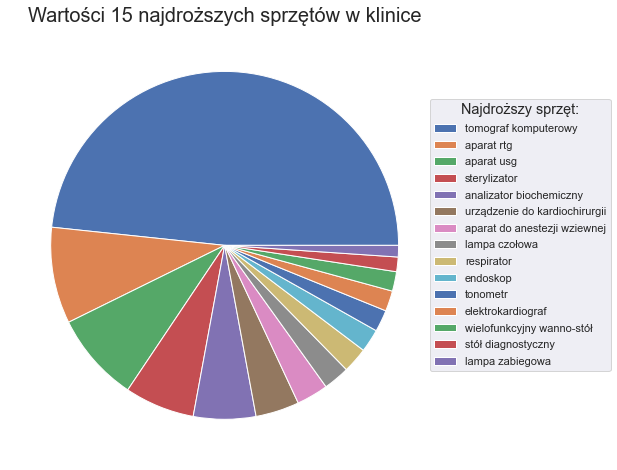

In [36]:
plt.figure(figsize = (8,8))
plt.pie(sprzet['Wartość'])



plt.legend(sprzet['Nazwa'],
           title = 'Najdroższy sprzęt:',
           title_fontsize = 'large',
           labelspacing = 0.6,
           bbox_to_anchor=(0.9, 0.35, 0.5, 0.5))
plt.title('Wartości 15 najdroższych sprzętów w klinice', fontsize=20)

plt.show()

---
---

## 3. ZWIERZĘTA

### 3.1 Wykres porównania dziennej liczby psów i kotów odwiedzających klinikę

<div style="text-align:justify">
Poniższe tabele zestawiają ze sobą dane dotyczące liczby psów i liczby kotów, która odwiedzała klinikę każdego dnia od momentu rozpoczęcia jej działalności. Dane dla obu gatunków nałożono również na wykres. </div>

<div style="text-align:justify">
    Zgodnie z legendą, niebieskim kolorem zaznaczono liczbę psów, a pomarańczową liczbę kotów. Wyraźnie widać, że liczba psów jest zdecydowanie większa od liczby kotów odwiedzających klinikę. Zgadza się to z intuicją oraz z przyjętymi na początku wypełniania bazy założeniami, że psów ma być więcej niż kotów. </div>

<div style="text-align:justify"> Na wykresie widoczny jest również moment, w którym klinika zaczęła się dynamicznie rozwijać i zyskiwać na popularności - jest to czerwiec 2020 roku. Wtedy liczba psów i liczba kotów odwiedzających dziennie klinikę nagle wzrasta.</div>

<div style="text-align:justify"> Warto zauważyć, że zdarzają się dni, kiedy klinikę odwiedził tylko jeden pies lub tylko jeden kot.</div>

In [37]:
dzienna_liczba_psów = pd.read_sql('''
            SELECT Data, COUNT(Gatunek) AS `Liczba psów`
            FROM Wizyty
            LEFT JOIN Zwierzęta
            USING(id_zwierzęcia)
            WHERE Gatunek = 'pies'
            GROUP BY Data
''', con=engine)
dzienna_liczba_psów.head()

,Data,Liczba psów
0,2019-10-05,1
1,2019-10-07,6
2,2019-10-08,1
3,2019-10-09,6
4,2019-10-10,8


In [38]:
dzienna_liczba_kotów = pd.read_sql('''
            SELECT Data, COUNT(Gatunek) AS `Liczba kotów`
            FROM Wizyty
            LEFT JOIN Zwierzęta
            USING(id_zwierzęcia)
            WHERE Gatunek = 'kot'
            GROUP BY Data
''', con=engine)
dzienna_liczba_kotów.head()

,Data,Liczba kotów
0,2019-10-07,1
1,2019-10-08,1
2,2019-10-09,3
3,2019-10-10,3
4,2019-10-11,2


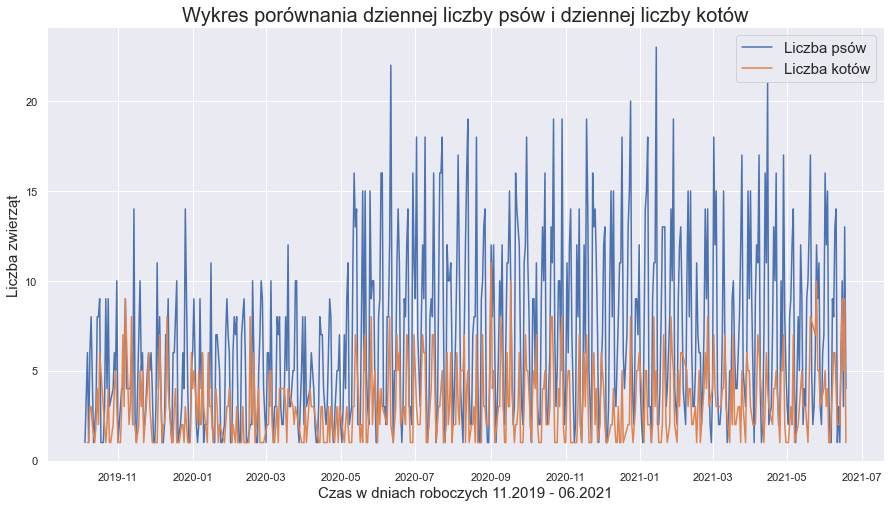

In [39]:
plt.figure()
plt.plot(dzienna_liczba_psów['Data'], dzienna_liczba_psów['Liczba psów'])
plt.plot(dzienna_liczba_kotów['Data'], dzienna_liczba_kotów['Liczba kotów'])

plt.legend(["Liczba psów", "Liczba kotów"], fontsize=15)
plt.xlabel('Czas w dniach roboczych 11.2019 - 06.2021', fontsize=15)
plt.ylabel('Liczba zwierząt', fontsize=15)
plt.title('Wykres porównania dziennej liczby psów i dziennej liczby kotów', fontsize=20)

plt.show()

### 3.2 Lista zwierząt, które spędziły w klinice najwięcej czasu

<div style="text-align:justify"> Rekordzistą pod względem czasu spędzonego w klinice jest szczur domowy o imieniu Zula - spędziła ona na stole weterynaryjnym łącznie 2 dni i prawie 13 godzin. Właścicielem szczura jest Pan Oliwier Klukiewicz (więcej o jego wizytach w klinice można przeczytać w sekcji o właścicielach, którzy zostawili w klinice najwięcej pieniędzy). Łącznie miała ona 36 zabiegów, rozpoczynając od zabiegów higienicznych, aż po poważne operacje. </div>

<div style="text-align:justify"> Drugie miejsce zajmuje buldog angielski Lunia, która spędziła w klinice łącznie 2 dni i prawie 5 godzin. Na trzecim miejscu znajduje się Demon, pies typu chart, który był badany przez lekarzy przez nieco ponad 2 dni.</div>

<div style="text-align:justify"> Reszta zwierząt leczonych w klinice nie przekroczyła granicy 2 dni.</div>

In [40]:
czas_wizyt = pd.read_sql('''
            SELECT id_zwierzęcia AS `ID zwierzęcia`, Imię, Gatunek, Rasa, SEC_TO_TIME(SUM(`Czas trwania wizyty`)) AS `Czas trwania wizyty`
            FROM Wizyty
            LEFT JOIN Zwierzęta
            USING(id_zwierzęcia)
            GROUP BY id_zwierzęcia  
            ORDER BY SEC_TO_TIME(SUM(`Czas trwania wizyty`)) DESC
''', con=engine)
czas_wizyt.head(10)

,ID zwierzęcia,Imię,Gatunek,Rasa,Czas trwania wizyty
0,1109,Zula,szczur domowy,None,2 days 12:58:20
1,673,Lunia,pies,buldog angielski,2 days 04:46:40
2,794,Demon,pies,chart,2 days 00:11:40
3,424,Mrówka,kot,gagamuffin,1 days 23:13:20
4,594,Rafa,jeż hodowlany,None,1 days 21:58:20
5,1035,Jim,królik,teddy,1 days 21:25:00
6,903,Edek,kot,tiffanie,1 days 21:16:40
7,832,Protos,pies,elkhund,1 days 18:21:40
8,1121,Balto,pies,golden retriever,1 days 18:05:00
9,528,Sunia,pies,skye,1 days 16:41:40


### 3.3 Lista zawierająca średni wiek, w którym dany gatunek jest poddawany eutanazji


<div style="text-align:justify"> Najbardziej przykrym dla właściciela zwierzęcia (ale również dla lekarza) zabiegiem jest poddanie zwierzęcia eutanazji. Sporządzono listę gatunków, gdzie każdemu gatunkowi przyporządkowano średni wiek, w którym poddaje się go eutanazji w klinice weterynaryjnej "APORT". </div>

<div style="text-align:justify"> Średni wiek zwierząt odwiedzających klinikę był generowany w oparciu o rzeczywistą żywotność danych gatunków, a nawet i ich ras. Dlatego też uzyskane wyniki zdają się być bardzo prawdziwe: koty i psy żyją relatywnie długo (jak na zwierzęta domowe), dlatego wiek ich usypiania również jest wysoki, czyli kolejno w przybliżeniu 8 i 6 lat. Najniżej w tabeli umieszczone są głównie żyjące krótko gryzonie, takie jak szczury domowe czy chomiki, które są usypiane średnio po roku swojego życia.</div>

<div style="text-align:justify"> Klinika weterynaryjna nie uśpiła żadnej myszy domowej. </div>

In [41]:
wiek = pd.read_sql('''
            SELECT Gatunek, DATE(NOW()) AS `Data obecna`, `Data urodzenia`, 
            YEAR(FROM_DAYS(DATEDIFF(DATE(NOW()),`Data urodzenia`))) AS Wiek
            FROM Zwierzęta
''', con=engine)
wiek

,Gatunek,Data obecna,Data urodzenia,Wiek
0,kot,2021-06-24,2017-03-16,4
1,pies,2021-06-24,2018-03-15,3
2,kot,2021-06-24,2019-05-27,2
3,szczur domowy,2021-06-24,2019-04-20,2
4,szczur domowy,2021-06-24,2021-03-01,0
...,...,...,...,...
1195,pies,2021-06-24,2011-08-08,9
1196,pies,2021-06-24,2021-02-22,0
1197,szynszyla,2021-06-24,2018-02-13,3
1198,kot,2021-06-24,2007-03-12,14


In [42]:
wiek = pd.read_sql('''
            SELECT Gatunek, AVG(Wiek) AS `Średni wiek`
            FROM (SELECT id_zwierzęcia, Gatunek, DATE(NOW()) AS `Data obecna`, `Data urodzenia`, 
            YEAR(FROM_DAYS(DATEDIFF(DATE(NOW()),`Data urodzenia`))) AS Wiek
            FROM Zwierzęta) AS subquery
            LEFT JOIN Wizyty
            USING(id_zwierzęcia)
            WHERE `Rodzaj wizyty` = "eutanazja"
            GROUP BY Gatunek
            ORDER BY `Średni wiek` DESC
''', con=engine)
wiek

,Gatunek,Średni wiek
0,kot,8.0426
1,pies,5.6620
2,ptak,4.5714
3,koszatniczka,4.0000
4,królik,3.6250
5,świnka morska,3.3889
6,jeż hodowlany,2.5000
7,myszoskoczek,2.0000
8,szczur domowy,1.0000
9,chomik,1.0000


### 3.4 Wykres przedstawiający, ile średnio pieniędzy jest przeznaczane na przedstawicieli poszczególnych ras kotów

<div style="text-align:justify"> Sprawdzono zatem jaką średnią kwotą przeznaczają właściciele na leczenie poszczególnych ras kotów. Okazuje się, że najwięcej pieniędzy przeznacza się na rasę tiffanie - na jednego przedstawiciela tej rasy wydaje się średnio prawie 1000 złotych. Średnio najmniej pieniędzy właściciele wydają na swoje koty syjamskie - kwota wynosi wtedy nieco ponad 200 złotych. </div>

In [43]:
liczba_osobników = pd.read_sql('''SELECT Rasa, COUNT(Rasa) AS 'Liczba przedstawicieli rasy'
                FROM Zwierzęta
                WHERE Gatunek = 'kot' 
                GROUP BY Rasa
                
                ''', con=engine)
liczba_osobników.head()

,Rasa,Liczba przedstawicieli rasy
0,abisyński,15
1,amerykański,9
2,balijski,7
3,bengalski,14
4,bobtail,16


In [44]:
cena_wizyt = pd.read_sql('''
            SELECT Gatunek, Rasa, SUM(Kwota) AS 'Wydana kwota'
            FROM Transakcje
            INNER JOIN Wizyty
            ON Transakcje.`id_wizyty jeśli wizyta` = Wizyty.id_wizyty
            INNER JOIN Zwierzęta
            ON Wizyty.id_zwierzęcia = Zwierzęta.id_zwierzęcia
            WHERE Gatunek = 'kot'
            GROUP BY Rasa
            
''', con=engine)
cena_wizyt.head()

,Gatunek,Rasa,Wydana kwota
0,kot,abisyński,7320.0
1,kot,amerykański,6050.0
2,kot,balijski,5000.0
3,kot,bengalski,6060.0
4,kot,bobtail,8920.0


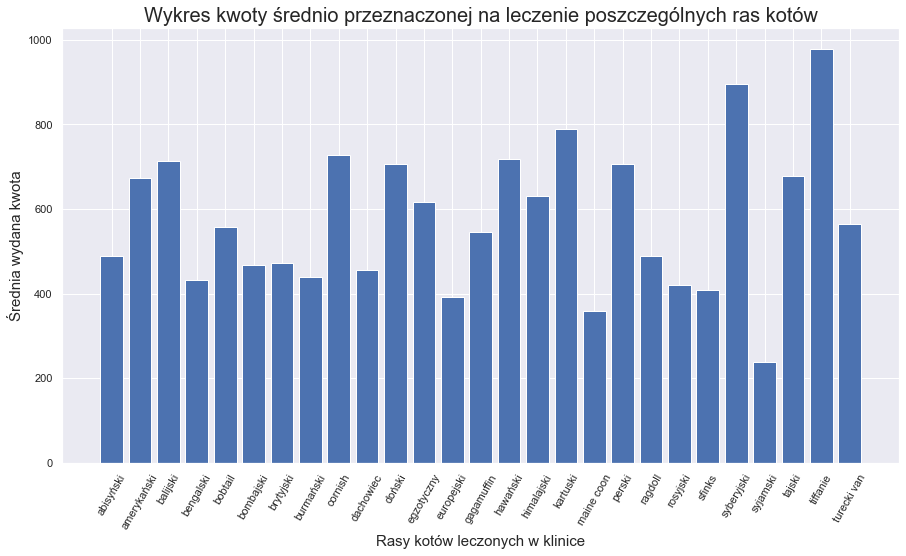

In [45]:
plt.figure()
plt.bar(cena_wizyt['Rasa'], cena_wizyt['Wydana kwota']/liczba_osobników['Liczba przedstawicieli rasy'])

plt.xlabel('Rasy kotów leczonych w klinice', fontsize=15)
plt.xticks(rotation=60)
plt.ylabel('Średnia wydana kwota', fontsize=15)
plt.title('Wykres kwoty średnio przeznaczonej na leczenie poszczególnych ras kotów', fontsize=20)

plt.show()

### 3.5 Wykres liczby ras w poszczególnych gatunkach leczonych w klinice

<div style="text-align:justify"> Poniższa tabela oraz wykres słupkowy prezentują ile psów danej rasy było leczonych w klinice weterynaryjnej. Ras psów jest niestety za dużo, żeby móc je czytelnie przedstawić na jednym wykresie, dlatego zdecydowano się wybrać 30 najczęściej wystąpujących ras. Zaprezentowano je na wykresie w kolejności od tych najbardziej popularnych. </div>

<div style="text-align:justify"> Widać, że najczęściej klinikę weterynaryjną odwiedzały sznaucery - ich liczba wynosi 21. Na drugim miejscu, z wynikiem 19 przedstawicieli, plasuje się rasa hollandse. Trzecie miejsce na podium zajmują psy rasy akita w liczbie 16.</div>

<div style="text-align:justify"> Na wykresie widać to, że rasy psów były losowane z rozkładu jednostajnego. Liczba plasujących się na czwartym miejscu w rankingu chartów jest równa 15 i jest tylko o cztery jednostki większa niż liczby rady skye, która zajmuje ostatnie miejsce w zaprezentowanym rankingu. </div>

In [46]:
rasy_psów = pd.read_sql('''
            SELECT Rasa, count(id_zwierzęcia) AS 'Liczba psów danej rasy'
            FROM Zwierzęta
            WHERE Gatunek = 'pies'
            GROUP BY Rasa
            ORDER BY count(id_zwierzęcia) DESC
            LIMIT 31
''', con=engine)
rasy_psów.head()

,Rasa,Liczba psów danej rasy
0,sznaucer,21
1,hollandse,19
2,akita,16
3,chart,15
4,drever,15


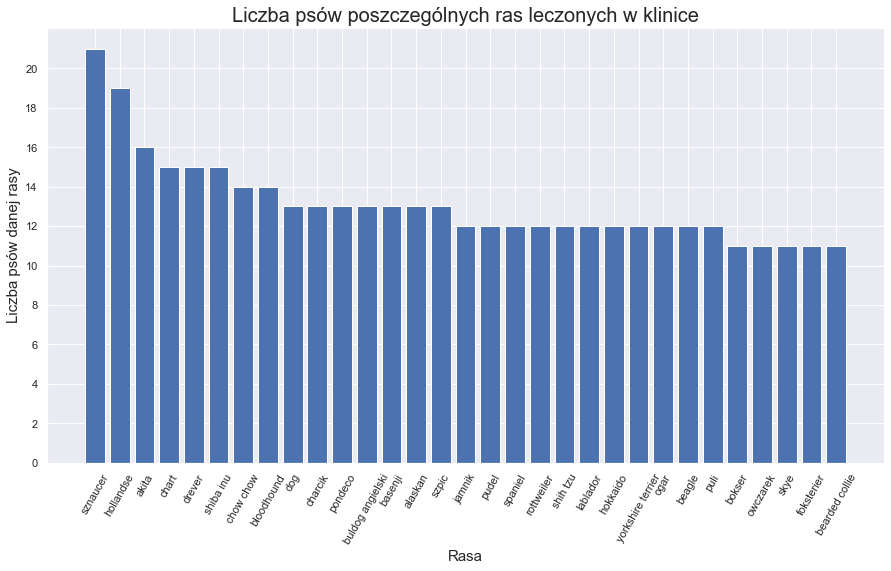

In [47]:
plt.figure()
plt.bar(rasy_psów['Rasa'], rasy_psów['Liczba psów danej rasy'])

plt.xlabel('Rasa', fontsize=15)
plt.xticks(rotation=60)
plt.yticks(np.arange(0,22,2))
plt.ylabel('Liczba psów danej rasy', fontsize=15)
plt.title('Liczba psów poszczególnych ras leczonych w klinice', fontsize=20)

plt.show()

<div style="text-align:justify"> Poniższa tabela oraz wykres słupkowy prezentują ile kotów danej rasy było leczonych w klinice weterynaryjnej. Ras kotów jest zdecydowanie mniej niż ras psów, dlatego można był zaprezentować je wszystkie na wykresie w kolejności od tych najbardziej popularnych. </div>

<div style="text-align:justify"> Widać, że najczęściej klinikę weterynaryjną odwiedzały koty burmańskie - ich liczba wynosi 18. Na drugim miejscu, z wynikiem 16 przedstawicieli, plasuje się rasa bobtail. Trzecie miejsce na podium zajmują hawańczyki w liczbie 15.</div>

<div style="text-align:justify"> Rasy kotów, podobnie do psów, również były losowane w oparciu o rozkład jednostajny. Ciekawym zjawiskiem jest zatem obecność tylko jednego kota himalajskiego, zwłaszcza w porównaniu z 18 przedstawicielami rasy burmańskiej. </div>

In [48]:
rasy_kotów = pd.read_sql('''
            SELECT Rasa, count(id_zwierzęcia) AS 'Liczba kotów danej rasy'
            FROM Zwierzęta
            WHERE Gatunek = 'kot'
            GROUP BY Rasa
            ORDER BY count(id_zwierzęcia) DESC
            
''', con=engine)
rasy_kotów.head()

,Rasa,Liczba kotów danej rasy
0,burmański,18
1,bobtail,16
2,hawański,15
3,bombajski,15
4,abisyński,15


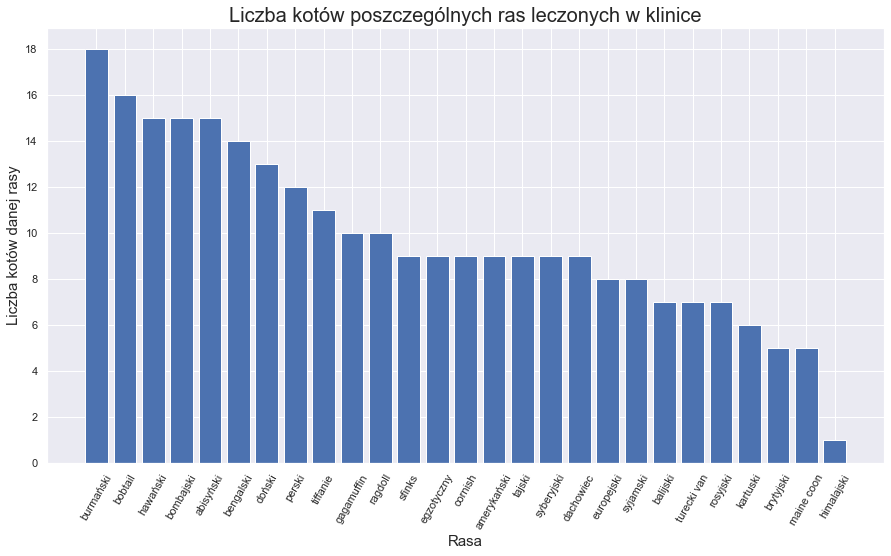

In [49]:
plt.figure()
plt.bar(rasy_kotów['Rasa'], rasy_kotów['Liczba kotów danej rasy'])

plt.xlabel('Rasa', fontsize=15)
plt.xticks(rotation=60)
plt.yticks(np.arange(0,20,2))
plt.ylabel('Liczba kotów danej rasy', fontsize=15)
plt.title('Liczba kotów poszczególnych ras leczonych w klinice', fontsize=20)

plt.show()

### 3.6 Wykres liczby zwierząt poszczególnych gatunków leczonych w klinice

<div style="text-align:justify"> Poniższa tabela oraz wykres kołowy przedstawiają ile zwierząt danego gatunku zostało zarejestowanych w klinice weterynaryjnej podczas całego okresu jej działalności. Zgodnie z intuicją, najczęściej występującycm gatunkiem jest pies - liczebność tego gatunku wynosi 726. Na drugim miejscu - również zgodnie z domysłami - plasują się koty, których liczba wynosi 266. Trzecie miejsce zajmują króliki z wynikiem 53 okazów. Wszystkich zwierząt rejestrowanych w klinice jest łącznie 1200.</div>

<div style="text-align:justify"> Ciekawym zjawiskiem jest wysoka pozycja jeży hodowlanych w rankingu liczebności gatunków. W klinice zarejestrowano więcej jeży hodowlanych niż szczurów domowych, szynszyli, myszy domowych czy - co szczególnie interesuję - chomików. Trzeba pamiętać, że liczebność zwierząt rejestrowanych w klinice nie odpowiada liczebności występowania danych gatunków w miejscowości czy kraju. Liczebność zwierząt rejestrowanych w klinice odpowiada raczej skłonnościom ludzi do leczenia danych gatunków. Prawdopodobnie chętniej leczy się zwierzęta droższe i egzotyczne - jak na przykład jeże hodowalane - oraz te uznawane za inteligentne - jak szczury domowe. Stąd, chociaż chomiki hoduje się w wielu domach, zajmują ostatnie miejsce w rankingu. </div>


In [50]:
najczęstsze_gatunki = pd.read_sql('''
            SELECT Gatunek, count(id_zwierzęcia) AS 'Liczba zwierząt danego gatunku'
            FROM Zwierzęta
            GROUP BY Gatunek
            ORDER BY count(id_zwierzęcia) DESC
            
''', con=engine)
najczęstsze_gatunki

,Gatunek,Liczba zwierząt danego gatunku
0,pies,726
1,kot,266
2,królik,53
3,świnka morska,49
4,ptak,36
5,koszatniczka,15
6,jeż hodowlany,14
7,szczur domowy,13
8,myszoskoczek,10
9,szynszyla,10


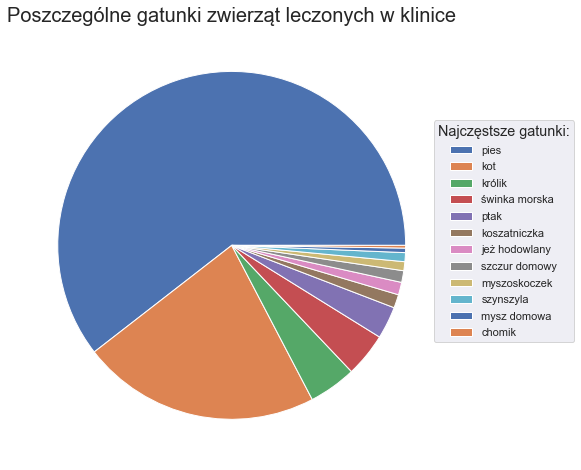

In [51]:
plt.figure(figsize = (8,8))
plt.pie(najczęstsze_gatunki['Liczba zwierząt danego gatunku'])



plt.legend(najczęstsze_gatunki['Gatunek'],
           title = 'Najczęstsze gatunki:',
           title_fontsize = 'large',
           labelspacing = 0.6,
           bbox_to_anchor=(0.8, 0.3, 0.5, 0.5))
plt.title('Poszczególne gatunki zwierząt leczonych w klinice', fontsize=20)

plt.show()

### 3.7 Wykres zależności wieku zwierzęcia od wieku właściciela

<div style="text-align:justify"> Zaprojektowano wykres zależności wieku zwierzęcia od wieku właściciela. Uwzględniono wszystkich właścicieli oraz ich wszystkie zwierzęta, które pojawiły się w klinice weterynaryjnej. Uwzględniono fakt, że jeden właściciel może posiadać kilka zwierząt. </div>

<div style="text-align:justify"> Patrząc na wykres nie można wskazać zależności między wiekiem zwierzęcia a wiekiem jego właściciela.</div>

In [52]:
wiek = pd.read_sql('''
            SELECT id_właściciela AS `ID właściciela`, PESEL, `Data urodzenia właściciela`,
            DATEDIFF(DATE(NOW()),`Data urodzenia właściciela`) /365 AS `Wiek właściciela`,
            id_zwierzęcia AS `ID zwierzęcia`, 
            DATEDIFF(DATE(NOW()),`Data urodzenia`) / 365 AS `Wiek zwierzęcia`
            FROM (SELECT id_właściciela, PESEL,
                        DATE(CASE WHEN LEFT(PESEL, 2)>10 THEN CONCAT("19",LEFT(PESEL, 6)) 
                            WHEN LEFT(PESEL, 2)="00" THEN 
                            CONCAT("2000",IF(CHAR_LENGTH(CAST(CAST(LEFT(PESEL, 6) AS INTEGER)-2000 AS CHAR))=3, 
                            CONCAT("0",CAST(CAST(LEFT(PESEL, 6) AS INTEGER)-2000 AS CHAR)),
                            CAST(CAST(LEFT(PESEL, 6) AS INTEGER)-2000 AS CHAR)))
                            ELSE CONCAT("20",CONCAT("0", CAST((CAST(LEFT(PESEL, 6) AS INTEGER)-2000) AS CHAR))) END) 
                            AS `Data urodzenia właściciela`
                        FROM Właściciele) AS subquery 
            RIGHT JOIN Zwierzęta
            USING(id_właściciela);
''', con=engine)
wiek

,ID właściciela,PESEL,Data urodzenia właściciela,Wiek właściciela,ID zwierzęcia,Wiek zwierzęcia
0,302,53091537272,1953-09-15,67.8192,1,4.2767
1,785,88051034142,1988-05-10,33.1452,2,3.2795
2,103,50051939499,1950-05-19,71.1479,3,2.0795
3,978,61103165582,1961-10-31,59.6877,4,2.1808
4,916,97042532749,1997-04-25,24.1808,5,0.3151
...,...,...,...,...,...,...
1195,496,00222486141,2000-02-24,21.3452,1196,9.8849
1196,402,82011248642,1982-01-12,39.4740,1197,0.3342
1197,322,50071239997,1950-07-12,71.0000,1198,3.3616
1198,209,86091766531,1986-09-17,34.7918,1199,14.2959


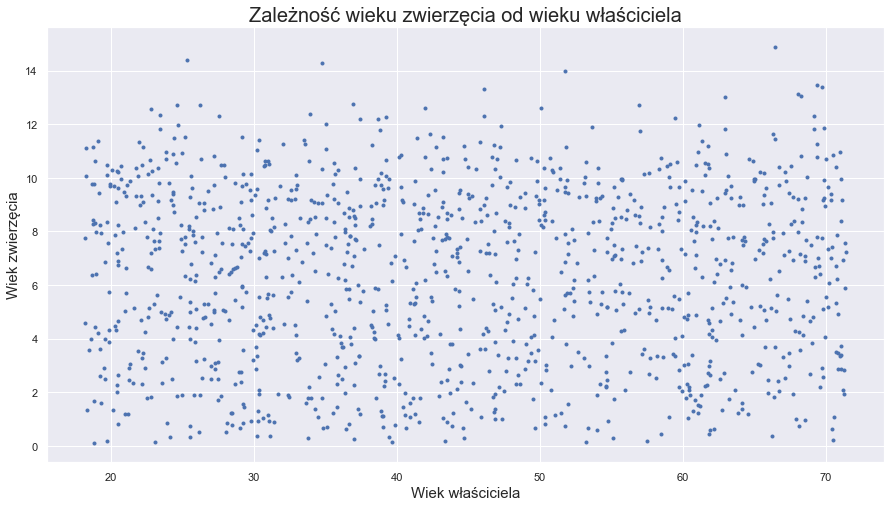

In [53]:
plt.figure()

plt.plot(wiek['Wiek właściciela'].values, wiek['Wiek zwierzęcia'].values,'.')
plt.title('Zależność wieku zwierzęcia od wieku właściciela', fontsize=20)
plt.xlabel('Wiek właściciela', fontsize=15)
plt.ylabel('Wiek zwierzęcia', fontsize=15)
plt.show()

### 3.8 Wykres porównania liczby samiczek i samców rejestrowanych w klinice

<div style="text-align:justify"> Poniższa tabela oraz  wykres kołowy przedstawiają porównanie liczby samic i samców rejestrowanych w klinice od początku jej działalności. Samice stanowią w przybliżeniu 63%, a samce 37% wszystkich zwierząt. Nie uwzględnia się innych płci niż samice i samce.</div>

<div style="text-align:justify"> Otrzymane wyniki zgadzają się z założeniami przyjętymi podczas wypełniania bazy danych, gdzie wylosowano, że samic będzie 751, a samców 449. Wszystkich zwierząt rejestrowanych w klinice jest razem 1200.</div>

In [54]:
samiczki_ce = pd.read_sql('''
            SELECT Płeć, count(Płeć)/(SELECT count(Płeć) FROM Zwierzęta) AS `Odsetek płci`
            FROM Zwierzęta
            GROUP BY Płeć            
''', con=engine)
samiczki_ce

,Płeć,Odsetek płci
0,K,0.6258
1,M,0.3742


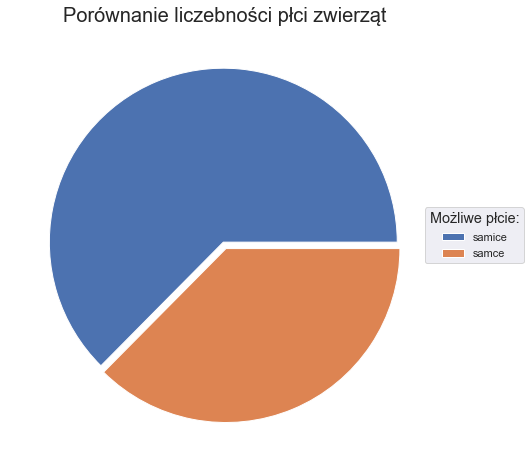

In [55]:
plt.figure(figsize = (8,8))
plt.pie(samiczki_ce['Odsetek płci'], explode = (0.02, 0.02))



plt.legend(['samice', 'samce'],
           title = 'Możliwe płcie:',
           title_fontsize = 'large',
           labelspacing = 0.6,
           bbox_to_anchor=(0.7, 0.1, 0.5, 0.5))
plt.title('Porównanie liczebności płci zwierząt', fontsize=20)

plt.show()

---
---

## 4. LEKARZE

### 4.1 Lista lekarzy, którzy najczęściej wydawali paszporty


<div style="text-align:justify"> W klinice weterynaryjnej "APORT" jest dwóch lekarzy: Kagata Awerska i Safał Rokołowski. Każdy z nich może wydawać zwierzętom paszporty. Przeprowadzili między sobą konkurs: kto wypisze więcej paszportów. Wyniki na dzień 18.06.2021 są zaskakujące - zawodnicy szli ze sobą łeb w łeb, ale niekwestionowanym mistrzem (czy raczej mistrzynią) wypisywania zwierzętom paszportów jest Kagata Awerska. Wypisała ona 166 paszportów, wyprzedzając tym samym Safała Rokołowskiego o dwa paszporty wypisane więcej.</div>

<div style="text-align:justify"> Dogłębna analiza danych wykazała, że zawodnicy oszukiwali nieco podczas wypisywania paszportów. Teoretycznie paszport powinny dostawać tylko zaczipowane psy, koty i fretki. Zawodnicy chcieli jednak zdobyć jak najwięcej punktów, dlatego proponowali wystawienie paszportu wszystkim przychodzącym właścicielom, niezależnie od gatunku czy oczipowania zwierzęcia. </div>

<div style="text-align:justify"> Spokojnie, lekarze ponieśli już konsekwencje swojego zachowania i z pewnością nie posuną się do tak haniebnych działań w przyszłości. Bardzo wstydzą się swojego zachowania i chcieliby wymazać je z pamięci swojej i wszystkich innych. Na nieszczęście Kagaty i Safała, wszystkie ich posunięcia zostały trwale zapisane w bazie danych kliniki weterynaryjnej "APORT" i będą tam widniały jeszcze przez długi, długi czas...</div>

In [56]:
lekarze = pd.read_sql('''
            SELECT id_pracownika AS `ID pracownika`, Imię, Nazwisko, COUNT(*) AS `Liczba wydanych paszportów`
            FROM Pracownicy
            LEFT JOIN Wizyty
            USING(id_pracownika)
            WHERE `Rodzaj wizyty` = "wydanie paszportu"
            GROUP BY id_pracownika
''', con=engine)
lekarze

,ID pracownika,Imię,Nazwisko,Liczba wydanych paszportów
0,1,Kagata,Awerska,166
1,2,Safał,Rokołowski,164


### 4.2 Lista lekarzy, którzy pobrali najwięcej pieniędzy za swoje wizyty

<div style="text-align:justify"> Na szczęście lekarze Kagata i Safał nie oszukiwali w innych kwestiach niż wydawanie paszportów (a przynajmniej potencjalne oszustwo na innej płaszczyźnie nie zostało im udowodnione). Wraz z chirurgiem Sarkiem Marupskim pobierali uczciwe zapłaty za swoją pracę - w końcu kierowali się słowami słynnego bohatera Sknerusa McKwacza: "Będę najtwardszym twardzielem i najsprytniejszym spryciarzem! Ale mój majątek zarobię uczciwie!". </div>

<div style="text-align:justify"> W liście lekarzy, którzy pobrali najwięcej pieniędzy za swoje wizyty, ponownie na prowadzenie wyszła Kagata Awerska. W ciągu tych dwóch lat przeprowadziła ona szereg zabiegów, których łączna wartość wyniosła 226090 złotych. Zaraz za nią, na drugim miejscu, plasuje się Safał Rokołowski, który wykonał badania na kwotę 219410 złotych. Ostatnie miejsce przypadło Sarkowi Marupskiemu - jest to najlepszy dowód na to, że nie zawsze tytuł zawodowy i posiadane umiejętności idą w parze z ilością zarabianych pieniędzy. </div>

In [57]:
lekarze = pd.read_sql('''
            SELECT id_pracownika AS `ID pracownika`, Imię, Nazwisko, SUM(Kwota) AS `Pobrana kwota`
            FROM Pracownicy
            LEFT JOIN (SELECT id_pracownika, Kwota
            FROM Wizyty
            LEFT JOIN Transakcje 
            ON Wizyty.id_wizyty=Transakcje.`id_wizyty jeśli wizyta`) AS subquery
            USING(id_pracownika)
            WHERE id_pracownika NOT IN (4,5)
            GROUP BY id_pracownika
''', con=engine)
lekarze

,ID pracownika,Imię,Nazwisko,Pobrana kwota
0,1,Kagata,Awerska,226090.0
1,2,Safał,Rokołowski,219410.0
2,3,Sarek,Marupski,213010.0


### 4.3 Lista lekarzy, którzy przepracowali w klinice najwięcej czasu 

<div style="text-align:justify"> Jedno pracownikom kliniki weterynaryjnej "APORT" trzeba przyznać - są oni wyjątkowo pracowici. Rzadko robią sobie przerwy podczas pracy i często biorą nadgodziny. Stąd bardzo wysokie wyniki jeśli chodzi o czas poświęcony na pracę w klinice każdego z lekarzy. Safał oraz Kagata spędzili w klinice ponad 63 dni! Niedaleko za nimi plasuje się Sarek, który pracował łącznie przed ponad 58 dni.   </div>

In [58]:
lekarze = pd.read_sql('''
            SELECT id_pracownika AS `ID pracownika`, Imię, Nazwisko, 
            SUM(TIME_TO_SEC(`Czas trwania wizyty`))/(3600*24) AS `Czas przepracowany w klinice w dniach`
            FROM Pracownicy
            RIGHT JOIN Wizyty
            USING(id_pracownika)
            WHERE id_pracownika NOT IN (4,5)
            GROUP BY id_pracownika
            ORDER BY `Czas przepracowany w klinice w dniach` DESC
''', con=engine)
lekarze

,ID pracownika,Imię,Nazwisko,Czas przepracowany w klinice w dniach
0,2,Safał,Rokołowski,63.8438
1,1,Kagata,Awerska,63.0417
2,3,Sarek,Marupski,58.0208


### 4.4 Lista lekarzy, którzy najwięcej razy przyjęli na wizytę psa typu corgie

<div style="text-align:justify"> Dawno, dawno temu, ponieważ jeszcze przed założeniem kliniki weterynaryjnej, dwóch ojców założycieli i trójka matek założycielek usiadła przy okrągłym stole. Każde z nich miało przed sobą kartkę czerpanego papieru, gęsie pióro oraz zapas atramentu. Na dworze już zmierzchało, wiatr dął ponuro i przejmująco, a zgromadzone towarzystwo oświatlały jedynie ustawione na stole zapalone świece...</div>

<div style="text-align:justify"> Tego wieczora musieli podjąć najważniejszą decyzję w całej swojej wspólnej karierze - wybrać rasę psa, która pojawi się w logo oraz będzie stanowiła motyw przewodni działalności kliniki weterynaryjnej. Atmosfera była bardzo napięta, zgromadzeni czuli napięcie i powagę całej sytuacji. Każde z nich chwyciło w ręce swoje gęsie pióro, zamoczyło je w atramencie i zapisało na kartce czerpanego papieru znaną tylko sobie nazwę psiej rasy.</div>

<div style="text-align:justify"> Nastała chwila prawdy. Cały stres i napięcie związane z presją wyznaczenia jednej psiej rasy, która spodoba się wszystkim zgromadzonym, odeszły w jednej chwili, kiedy okazało się, jak jednomyślni są wspólnicy. Na każdej z pięciu kartek widniał ten sam wykaligrafowany z namaszczeniem napis - welsh corgi. </div>

<div style="text-align:justify"> Dlatego właśnie w logo kliniki weterynaryjnej "APORT" pojawia się rasa welsh corgi. Lekarze konkurowali ze sobą przez cały okres działalności kliniki, żeby sprawdzić, który z nich więcej razy przyjmie na wizytę psa rasy welsh corgi. Wygrana w tym konkursie jest dla każdego z nich najwyższym celem całej pracy w klinice. Tym razem zwyciężył Safał Rokołowski, który przyjął na wizytę psa rasy welsh corgi aż 11 razy. Po piętach depcze mu Sarek Marupski, który osiągną wynik 10. Mężczyzni pozostawili w tyle Kagatę Awerską, której udało się zbadać welsh corgi jedynie 6 razy. </div>

In [59]:
corgi = pd.read_sql('''
            SELECT id_zwierzęcia AS `ID zwierzęcia`, Rasa
            FROM Zwierzęta
            WHERE Rasa="welsh corgi"
''', con=engine)
corgi

,ID zwierzęcia,Rasa
0,120,welsh corgi
1,155,welsh corgi
2,501,welsh corgi
3,663,welsh corgi
4,789,welsh corgi
5,923,welsh corgi
6,971,welsh corgi
7,985,welsh corgi


In [60]:
corgi = pd.read_sql('''
            SELECT Zwierzęta.id_zwierzęcia AS `ID zwierzęcia`, id_wizyty AS `ID wizyty`, id_pracownika AS `ID pracownika`, Rasa
            FROM Wizyty
            LEFT JOIN Zwierzęta
            ON Wizyty.id_zwierzęcia=Zwierzęta.id_zwierzęcia 
            WHERE Zwierzęta.Rasa = "welsh corgi"
''', con=engine)
corgi.head(10)

,ID zwierzęcia,ID wizyty,ID pracownika,Rasa
0,120,224,3,welsh corgi
1,120,302,2,welsh corgi
2,120,383,2,welsh corgi
3,120,441,2,welsh corgi
4,120,709,2,welsh corgi
5,120,746,2,welsh corgi
6,663,1010,1,welsh corgi
7,120,1251,1,welsh corgi
8,120,1837,1,welsh corgi
9,120,2228,2,welsh corgi


In [61]:
corgi = pd.read_sql('''
            SELECT id_pracownika AS `ID pracownika`, Imię, Nazwisko, COUNT(id_wizyty) AS `Liczba wizyt welsh corgi`
            FROM Pracownicy
            LEFT JOIN (SELECT Zwierzęta.id_zwierzęcia, id_wizyty, id_pracownika, Rasa
            FROM Wizyty
            LEFT JOIN Zwierzęta
            ON Wizyty.id_zwierzęcia=Zwierzęta.id_zwierzęcia 
            WHERE Zwierzęta.Rasa = "welsh corgi") AS subquery
            USING(id_pracownika)
            WHERE id_pracownika NOT IN (4,5)
            GROUP BY id_pracownika
            ORDER BY `Liczba wizyt welsh corgi` DESC
''', con=engine)
corgi

,ID pracownika,Imię,Nazwisko,Liczba wizyt welsh corgi
0,2,Safał,Rokołowski,11
1,3,Sarek,Marupski,10
2,1,Kagata,Awerska,6


---

## 5. PODSUMOWANIE

<div style="text-align:justify"> Poniższe zdjęcia przedstawiają #team20 podczas pracy nad tworzeniem bazy danych w ramach projektu końcowego. W skład grupy wchodzą (w kolejności alfabetycznej nazwisk): Marta Jaworska, Agata Kawerska, Marta Kroczak, Rafał Sokołowski. </div>

<div style="text-align:justify"> Zbieżność imion i nazwisk z pracownikami kliniki weterynaryjnej jest w pełni przypadkowa.</div>

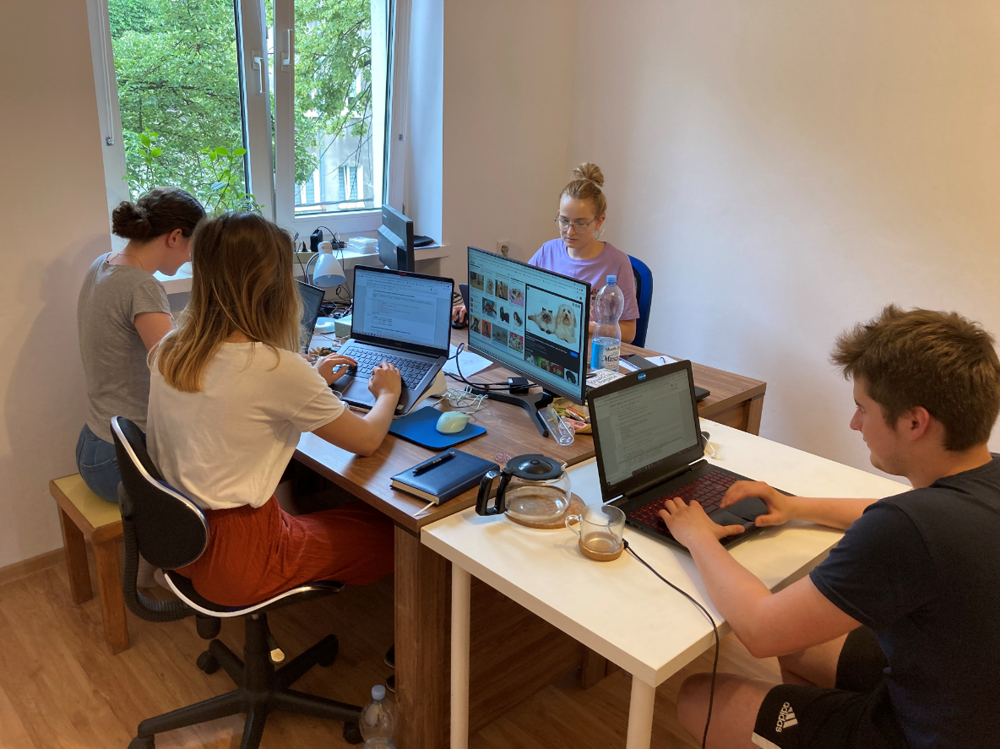

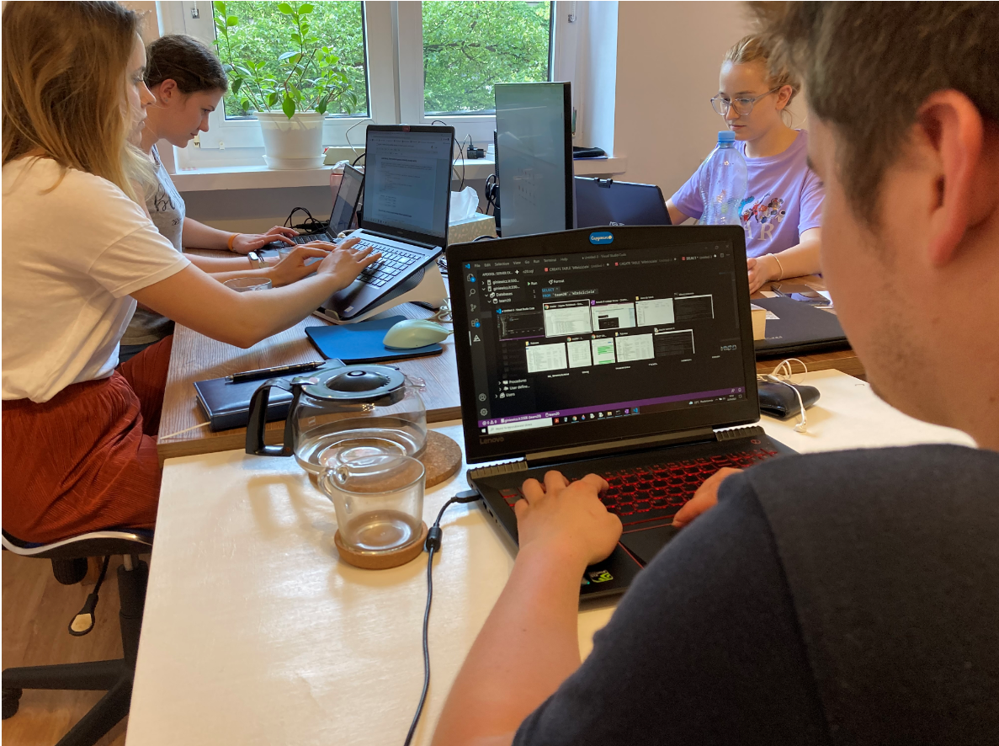

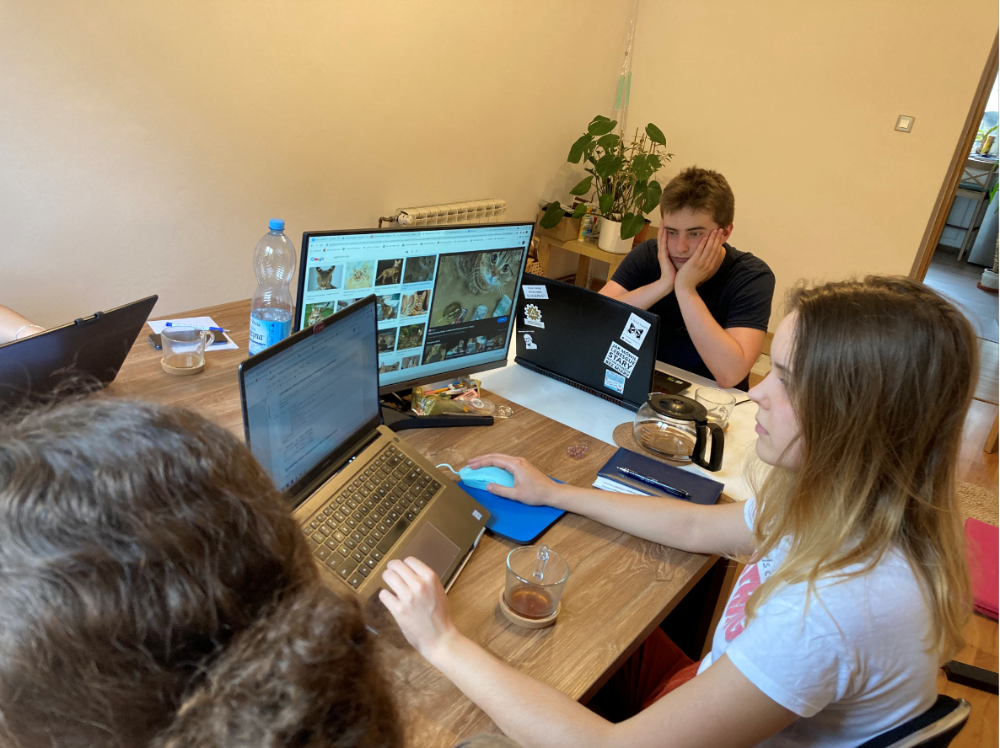